### Context
- Reduction of child mortality is reflected in several of the United Nations' Sustainable Development Goals  - and is a key indicator of human progress.
The UN expects that by 2030, countries end preventable deaths of newborns and children under 5 years of age, with all countries aiming to reduce under‑5 mortality to at least as low as 25 per 1,000 live births.

- Parallel to notion of child mortality is of course maternal mortality, which accounts for 295 000 deaths during and following pregnancy and childbirth (as of 2017). The vast majority of these deaths (94%) occurred in low-resource settings, and most could have been prevented.

- In light of what was mentioned above, Cardiotocograms (CTGs) are a simple and cost accessible option to assess fetal health, allowing healthcare professionals to take action in order to prevent child and maternal mortality. The equipment itself works by sending ultrasound pulses and reading its response, thus shedding light on fetal heart rate (FHR), fetal movements, uterine contractions and more.

Data
This dataset contains 2126 records of features extracted from Cardiotocogram exams, which were then classified by three expert obstetritians into 3 classes:

- Normal
- Suspect
- Pathological

In [7]:
# To avoid any unnesscery warnings
import warnings
warnings.simplefilter(action="ignore")
warnings.filterwarnings('ignore')

In [3]:
import pyspark
#
from collections import Counter
from pyspark.sql import SparkSession

# import necessary package
import numpy as np
import pandas as pd

# Data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# For saving the file
import os

In [5]:
# Algorithims
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import precision_recall_fscore_support

In [5]:
# data directory
import os
for dirname, _ , filenames in os.walk("/kaggle/input"):
    for filename in filenames:
        print(os.path.join(dirname,filename))

In [ ]:
spark = SparkSession.builder.appName('practice').getOrCreate()

In [ ]:
spark

In [ ]:
df_pyspark = spark.read.csv("fetal_health.csv")

In [ ]:
df_pyspark = spark.read.option('header','true').csv("fetal_health.csv")

In [ ]:
df_pyspark

DataFrame[baseline value: string, accelerations: string, fetal_movement: string, uterine_contractions: string, light_decelerations: string, severe_decelerations: string, prolongued_decelerations: string, abnormal_short_term_variability: string, mean_value_of_short_term_variability: string, percentage_of_time_with_abnormal_long_term_variability: string, mean_value_of_long_term_variability: string, histogram_width: string, histogram_min: string, histogram_max: string, histogram_number_of_peaks: string, histogram_number_of_zeroes: string, histogram_mode: string, histogram_mean: string, histogram_median: string, histogram_variance: string, histogram_tendency: string, fetal_health: string]

In [ ]:
df_pyspark = spark.read.option('header','true').csv("fetal_health.csv")

In [ ]:
df_pyspark.show(n=10)

+--------------+-------------+--------------+--------------------+-------------------+--------------------+------------------------+-------------------------------+------------------------------------+------------------------------------------------------+-----------------------------------+---------------+-------------+-------------+-------------------------+--------------------------+--------------+--------------+----------------+------------------+------------------+------------+
|baseline value|accelerations|fetal_movement|uterine_contractions|light_decelerations|severe_decelerations|prolongued_decelerations|abnormal_short_term_variability|mean_value_of_short_term_variability|percentage_of_time_with_abnormal_long_term_variability|mean_value_of_long_term_variability|histogram_width|histogram_min|histogram_max|histogram_number_of_peaks|histogram_number_of_zeroes|histogram_mode|histogram_mean|histogram_median|histogram_variance|histogram_tendency|fetal_health|
+--------------+--------

In [ ]:
df_pyspark.printSchema()

root
 |-- baseline value: string (nullable = true)
 |-- accelerations: string (nullable = true)
 |-- fetal_movement: string (nullable = true)
 |-- uterine_contractions: string (nullable = true)
 |-- light_decelerations: string (nullable = true)
 |-- severe_decelerations: string (nullable = true)
 |-- prolongued_decelerations: string (nullable = true)
 |-- abnormal_short_term_variability: string (nullable = true)
 |-- mean_value_of_short_term_variability: string (nullable = true)
 |-- percentage_of_time_with_abnormal_long_term_variability: string (nullable = true)
 |-- mean_value_of_long_term_variability: string (nullable = true)
 |-- histogram_width: string (nullable = true)
 |-- histogram_min: string (nullable = true)
 |-- histogram_max: string (nullable = true)
 |-- histogram_number_of_peaks: string (nullable = true)
 |-- histogram_number_of_zeroes: string (nullable = true)
 |-- histogram_mode: string (nullable = true)
 |-- histogram_mean: string (nullable = true)
 |-- histogram_medi

In [ ]:
df_pyspark.describe().show()

+-------+-----------------+--------------------+--------------------+--------------------+--------------------+--------------------+------------------------+-------------------------------+------------------------------------+------------------------------------------------------+-----------------------------------+------------------+------------------+------------------+-------------------------+--------------------------+------------------+------------------+------------------+------------------+-------------------+------------------+
|summary|   baseline value|       accelerations|      fetal_movement|uterine_contractions| light_decelerations|severe_decelerations|prolongued_decelerations|abnormal_short_term_variability|mean_value_of_short_term_variability|percentage_of_time_with_abnormal_long_term_variability|mean_value_of_long_term_variability|   histogram_width|     histogram_min|     histogram_max|histogram_number_of_peaks|histogram_number_of_zeroes|    histogram_mode|    histogr

In [ ]:
df_pyspark= df_pyspark.groupBy(df_pyspark.columns).count().filter("count > 1").drop("count")
df_pyspark.show()

+--------------+-------------+--------------+--------------------+-------------------+--------------------+------------------------+-------------------------------+------------------------------------+------------------------------------------------------+-----------------------------------+---------------+-------------+-------------+-------------------------+--------------------------+--------------+--------------+----------------+------------------+------------------+------------+
|baseline value|accelerations|fetal_movement|uterine_contractions|light_decelerations|severe_decelerations|prolongued_decelerations|abnormal_short_term_variability|mean_value_of_short_term_variability|percentage_of_time_with_abnormal_long_term_variability|mean_value_of_long_term_variability|histogram_width|histogram_min|histogram_max|histogram_number_of_peaks|histogram_number_of_zeroes|histogram_mode|histogram_mean|histogram_median|histogram_variance|histogram_tendency|fetal_health|
+--------------+--------

In [7]:
f_df = pd.read_csv('E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\datasets\_fetal_health.csv')

In [9]:
f_df_copy = pd.read_csv('fetal_health.csv')

In [10]:
f_df.head(n=3)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.0,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.0,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.0,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0


In [29]:
for key,value in f_df.head(n=1).items():
    print(value)

0    120.0
Name: baseline value, dtype: float64
0    0.0
Name: accelerations, dtype: float64
0    0.0
Name: fetal_movement, dtype: float64
0    0.0
Name: uterine_contractions, dtype: float64
0    0.0
Name: light_decelerations, dtype: float64
0    0.0
Name: severe_decelerations, dtype: float64
0    0.0
Name: prolongued_decelerations, dtype: float64
0    73.0
Name: abnormal_short_term_variability, dtype: float64
0    0.5
Name: mean_value_of_short_term_variability, dtype: float64
0    43.0
Name: percentage_of_time_with_abnormal_long_term_variability, dtype: float64
0    2.4
Name: mean_value_of_long_term_variability, dtype: float64
0    64.0
Name: histogram_width, dtype: float64
0    62.0
Name: histogram_min, dtype: float64
0    126.0
Name: histogram_max, dtype: float64
0    2.0
Name: histogram_number_of_peaks, dtype: float64
0    0.0
Name: histogram_number_of_zeroes, dtype: float64
0    120.0
Name: histogram_mode, dtype: float64
0    137.0
Name: histogram_mean, dtype: float64
0    121.0
N

In [ ]:
f_df.tail(n=4)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
2122,140.0,0.001,0.000,0.007,0.0,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.0,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.0,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0
2125,142.0,0.002,0.002,0.008,0.0,0.0,0.0,74.0,0.4,36.0,...,117.0,159.0,2.0,1.0,145.0,143.0,145.0,1.0,0.0,1.0


In [12]:
f_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 22 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   baseline value                                          2126 non-null   float64
 1   accelerations                                           2126 non-null   float64
 2   fetal_movement                                          2126 non-null   float64
 3   uterine_contractions                                    2126 non-null   float64
 4   light_decelerations                                     2126 non-null   float64
 5   severe_decelerations                                    2126 non-null   float64
 6   prolongued_decelerations                                2126 non-null   float64
 7   abnormal_short_term_variability                         2126 non-null   float64
 8   mean_value_of_short_term_variability  

In [5]:
relative_fetal_features_description = os.path.join("..", "graphics", "_fetal_features_description.png")

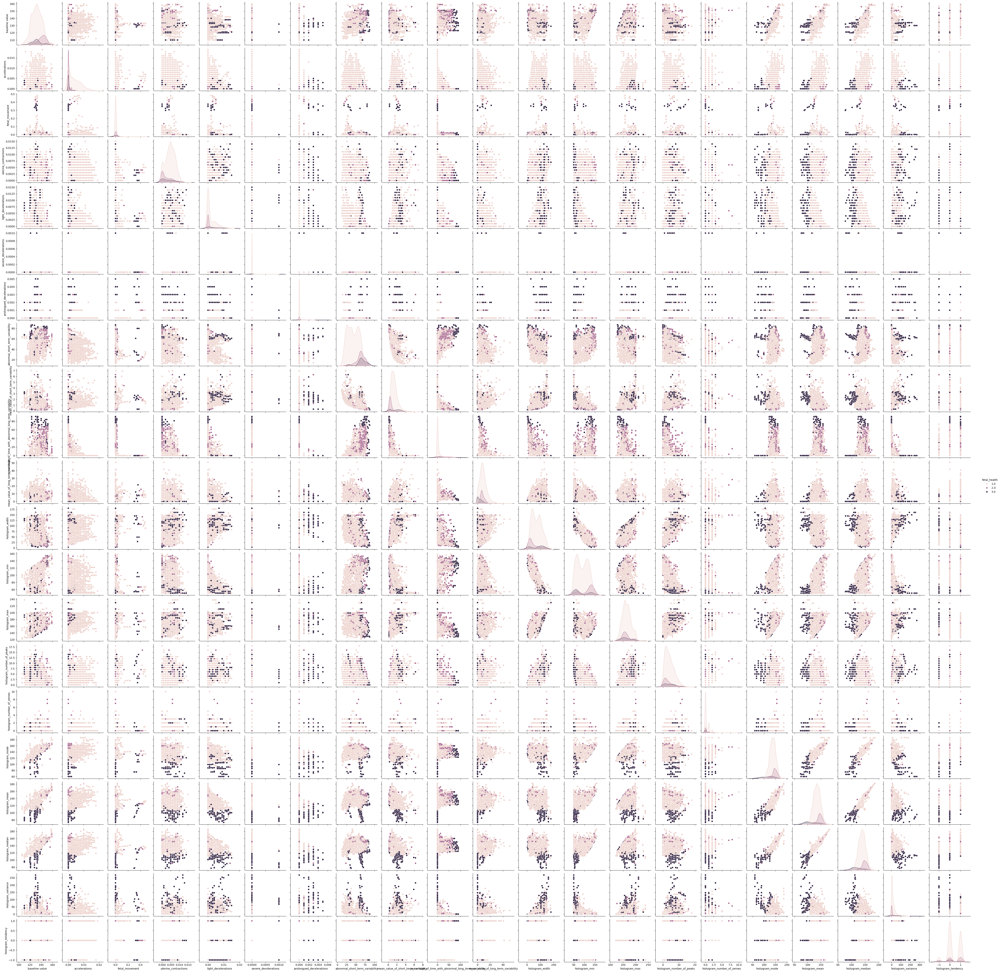

<Figure size 1000x1000 with 0 Axes>

In [8]:
sns.pairplot(f_df,hue="fetal_health")
plt.figure(figsize=(10,10))
plt.savefig(relative_fetal_features_description)

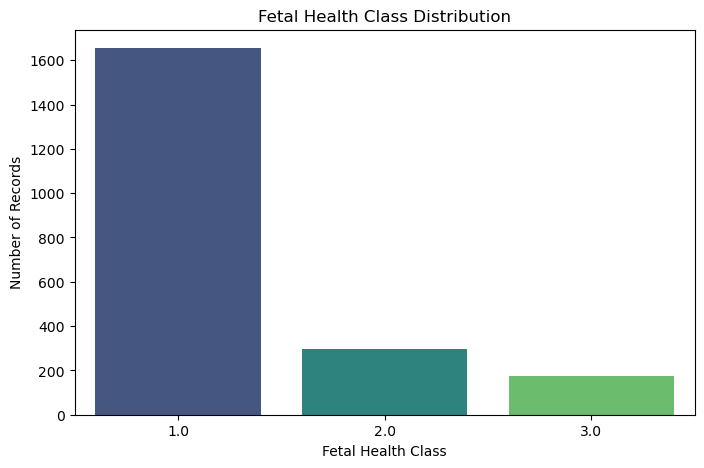

In [ ]:
# Visualizing the distribution of the target variable 'fetal_health'
# This count plot shows the number of records in each class (1: Normal, 2: Suspect, 3: Pathological)

plt.figure(figsize=(8, 5))  # Set the figure size for better readability
sns.countplot(x='fetal_health', data=f_df, palette='viridis')  # Create a count plot with a color palette

# Adding plot titles and axis labels
plt.title('Fetal Health Class Distribution')  # Plot title
plt.xlabel('Fetal Health Class')  # X-axis label
plt.ylabel('Number of Records')  # Y-axis label
relative_path_fetal_helath_class_distribuation = os.path.join("..", "graphics", "_fetal_helath_class_distribuation.png")
plt.savefig(relative_path_fetal_helath_class_distribuation)
plt.show()  # Display the plot

7. Pairplot for Selected Features¶
This section uses a pairplot to visualize the relationships between selected features and the target variable (fetal_health). This helps explore:

How features are distributed for different classes.
Potential patterns or separability between classes.

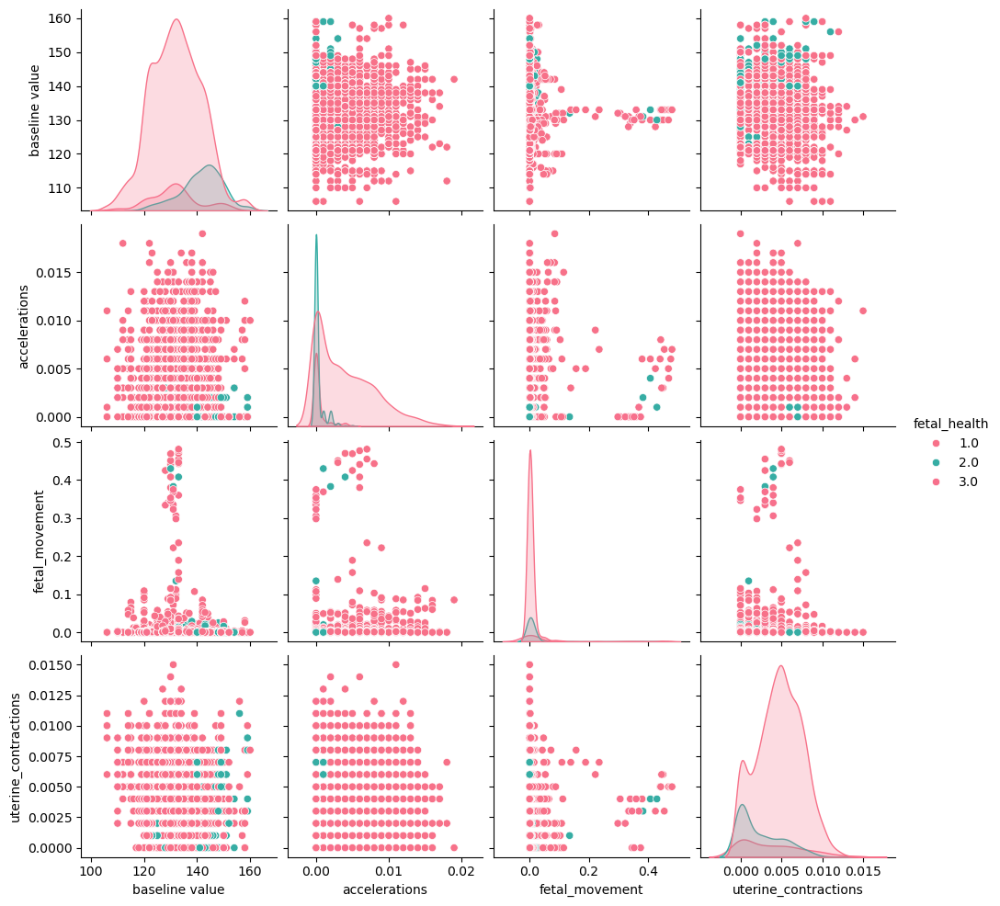

In [17]:
# Visualizing pairwise relationships among selected features
selected_features = ['baseline value', 'accelerations', 'fetal_movement', 'uterine_contractions', 'fetal_health']
sns.pairplot(f_df[selected_features], hue='fetal_health', palette='husl')  # Create a pairplot with class coloring
plt.savefig("./graphics/fetal_pairwise_relationship_wrt_selectedfeatures")
plt.show()  # Display the plot

8. Checking for Outliers using Boxplots
- Boxplots are used to identify potential outliers in each feature. Outliers may affect model performance and require special handling.

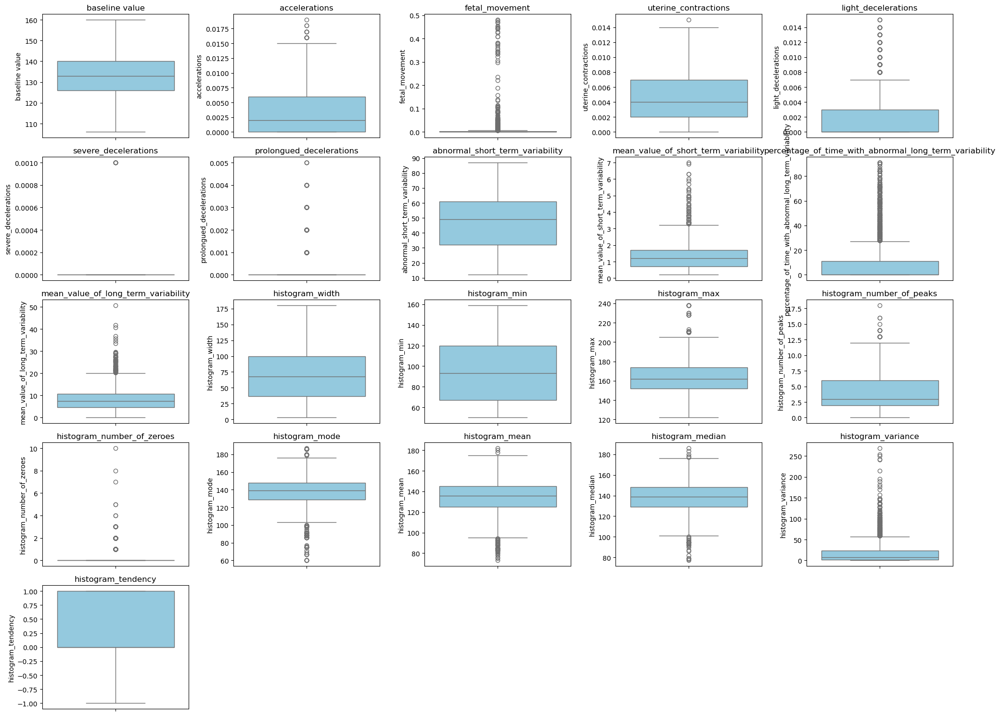

In [20]:
# Plotting boxplots for each feature to identify potential outliers
plt.figure(figsize=(20, 15))  # Set the figure size
for index, column in enumerate(f_df.columns[:-1], 1):  # Exclude the target column
    plt.subplot(5, 5, index)
    sns.boxplot(f_df[column], color='skyblue')  # Create a boxplot for each feature
    plt.title(column)  # Add feature name as the title
plt.tight_layout()
plt.savefig(".\graphics\_fetal_boxplot.png")# Adjust layout for better readability
plt.show()  # Display the plots

9. Checking for Missing Values
- This section checks for missing values in the dataset to ensure completeness and consistency

In [21]:
# Checking for missing values in the dataset
missing_values = f_df.isnull().sum()  # Count missing values in each column
print("\nMissing Values:")
print(missing_values)


Missing Values:
baseline value                                            0
accelerations                                             0
fetal_movement                                            0
uterine_contractions                                      0
light_decelerations                                       0
severe_decelerations                                      0
prolongued_decelerations                                  0
abnormal_short_term_variability                           0
mean_value_of_short_term_variability                      0
percentage_of_time_with_abnormal_long_term_variability    0
mean_value_of_long_term_variability                       0
histogram_width                                           0
histogram_min                                             0
histogram_max                                             0
histogram_number_of_peaks                                 0
histogram_number_of_zeroes                                0
histogram_mode         

10. Statistical Summary for Each Class
 - Here, we compute the mean of each feature grouped by the target variable (fetal_health). This helps identify key differences between the classes.

In [22]:
# Calculating the mean of each feature for each class
grouped_data = f_df.groupby('fetal_health').mean()
print("\nStatistical Summary for Each Class:")
print(grouped_data.T)  # Transpose for better readability


Statistical Summary for Each Class:
fetal_health                                                 1.0         2.0  \
baseline value                                      1.319819e+02  141.684746   
accelerations                                       3.992145e-03    0.000275   
fetal_movement                                      7.963142e-03    0.008332   
uterine_contractions                                4.780665e-03    0.002390   
light_decelerations                                 1.941390e-03    0.000536   
severe_decelerations                                6.042296e-07    0.000000   
prolongued_decelerations                            5.135952e-05    0.000095   
abnormal_short_term_variability                     4.246586e+01   61.901695   
mean_value_of_short_term_variability                1.430634e+00    0.638983   
percentage_of_time_with_abnormal_long_term_vari...  5.044713e+00   29.030508   
mean_value_of_long_term_variability                 8.705498e+00    8.026102   
his

11. Distribution of Selected Features
 - This section plots the distribution of selected features across the three classes. It helps visualize how well the features separate the classes.

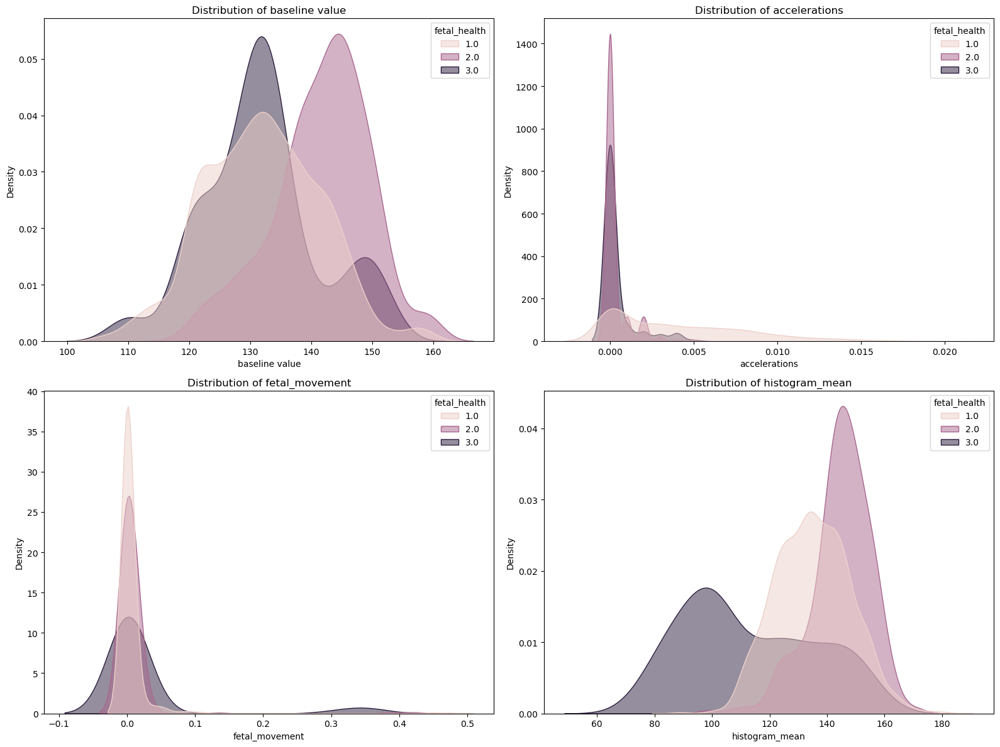

In [24]:
# Handle infinite values and missing data
f_df.replace([np.inf, -np.inf], np.nan, inplace=True)  # Replace infinite values with NaN
f_df.dropna(inplace=True)  # Drop rows with NaN

# Plotting distributions for selected features
features_to_plot = ['baseline value', 'accelerations', 'fetal_movement', 'histogram_mean']
plt.figure(figsize=(16, 12))

for i, feature in enumerate(features_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.kdeplot(
        data=f_df, 
        x=feature, 
        hue="fetal_health", 
        fill=True, 
        common_norm=False, 
        alpha=0.5
    )
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Density')

plt.tight_layout()
plt.savefig(".\graphics\_fetal_distribution_selected_features.png")
plt.show()

In [31]:
f_col = f_df.columns

In [32]:
scale_x = StandardScaler()

In [33]:
f_col = [col for col in f_df.columns if col!= 'fetal_health']

In [35]:
print(scale_x.fit_transform(f_df.drop(["fetal_health"], axis=1)).shape)
print(len(f_col))  # Ensure this matches the number of columns

(2126, 21)
21


In [36]:
X_vari = pd.DataFrame(scale_x.fit_transform(f_df.drop(['fetal_health'],axis=1),),   columns=f_col)

In [37]:
X_vari.columns

Index(['baseline value', 'accelerations', 'fetal_movement',
       'uterine_contractions', 'light_decelerations', 'severe_decelerations',
       'prolongued_decelerations', 'abnormal_short_term_variability',
       'mean_value_of_short_term_variability',
       'percentage_of_time_with_abnormal_long_term_variability',
       'mean_value_of_long_term_variability', 'histogram_width',
       'histogram_min', 'histogram_max', 'histogram_number_of_peaks',
       'histogram_number_of_zeroes', 'histogram_mode', 'histogram_mean',
       'histogram_median', 'histogram_variance', 'histogram_tendency'],
      dtype='object')

In [38]:
Y_vari = pd.DataFrame(f_df["fetal_health"])
Y_vari

,fetal_health
0,2.0
1,1.0
2,1.0
3,1.0
4,1.0
...,...
2121,2.0
2122,2.0
2123,2.0
2124,2.0


In [39]:
X_train,X_test,Y_train,Y_test = train_test_split(X_vari,Y_vari,test_size=0.3,random_state=42,stratify=Y_vari)

In [40]:
X_test.shape,X_train.shape,Y_train.shape,Y_test.shape

((638, 21), (1488, 21), (1488, 1), (638, 1))

In [41]:
from sklearn.metrics import accuracy_score,roc_auc_score,precision_recall_curve,f1_score,recall_score,precision_score

In [42]:
gb_classifier = GradientBoostingClassifier(n_estimators=100,random_state=42)

In [43]:
gb_classifier.fit(X_train,Y_train)

GradientBoostingClassifier(random_state=42)

In [44]:
y_pred = gb_classifier.predict(X_test)

In [45]:
accuracy = accuracy_score(Y_test,y_pred)
precision = precision_score(Y_test,y_pred,average="weighted")
recall = recall_score(Y_test,y_pred,average="weighted")
f1 = f1_score(Y_test,y_pred,average="weighted")

15. Evaluating the Baseline Model¶
- The baseline Random Forest model is evaluated using metrics such as:

  - Confusion Matrix
  - Classification Report
  - ROC-AUC Score

In [46]:
# calculate AUC for multiclass 
y_score = gb_classifier.predict_proba(X_test)
auc_score = roc_auc_score(Y_test,y_score,average="weighted",multi_class='ovr')

In [40]:
print(len(Y_test))
print(len(y_score))

638
638


In [47]:
# Evaluating the baseline model's performance
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

print("Confusion Matrix:")
print(confusion_matrix(Y_test, y_pred))  # Confusion matrix

print("\nClassification Report:")
print(classification_report(Y_test, y_pred))  # Classification report

Confusion Matrix:
[[485   8   4]
 [ 23  62   3]
 [  3   1  49]]

Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.98      0.96       497
         2.0       0.87      0.70      0.78        88
         3.0       0.88      0.92      0.90        53

    accuracy                           0.93       638
   macro avg       0.90      0.87      0.88       638
weighted avg       0.93      0.93      0.93       638



In [48]:
import numpy as np
from sklearn.metrics import roc_auc_score

# Example checks
Y_test = np.array(Y_test)
y_score = np.array(y_score)

if len(Y_test) == len(y_score):
    auc_score = roc_auc_score(Y_test, y_score, average="weighted", multi_class='ovr')
    print("AUC Score:", auc_score)
else:
    print(f"Lengths of Y_test ({len(Y_test)}) and y_score ({len(y_score)}) do not match.")


AUC Score: 0.9733887953720542


In [49]:
y_score = y_score[:len(Y_test)]
auc_score = roc_auc_score(Y_test, y_score, average="weighted", multi_class='ovr')
print("AUC Score:", auc_score)

AUC Score: 0.9733887953720542


In [50]:
# calculate specificity for the entrie multiclass problem
confusion = confusion_matrix(Y_test,y_pred)
true_negative = np.sum(np.diag(confusion))
false_positive = np.sum(confusion) - true_negative
specificity = true_negative/ (true_negative+false_positive)

In [51]:
# printing here the caluctaion and evalution of the models
print(f"Accuracy:{accuracy:2f}")
print(f"Presicion:{precision:2f}")
print(f"Recall:{recall:2f}")
print(f"F1:{f1:2f}")
print(f"AUC scores:{auc_score:2f}")
print(f"specificity:{specificity:2f}") 

Accuracy:0.934169
Presicion:0.932496
Recall:0.934169
F1:0.931887
AUC scores:0.973389
specificity:0.934169


16. Hyperparameter Tuning with GridSearchCV
Hyperparameter tuning is performed on the Gradient Boosting Classifier model to find the best combination of parameters for improved performance. GridSearchCV is used to:

Explore multiple combinations of n_estimators and max_depth.
Evaluate each combination using 5-fold cross-validation.

In [52]:
# Hyperparameter tuning using GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30]
}

grid_search = GridSearchCV(GradientBoostingClassifier(random_state=42), param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, Y_train)

print("Best Parameters:", grid_search.best_params_)  # Display the best parameters

Best Parameters: {'max_depth': 10, 'n_estimators': 200}


17. Training the Optimized Gradient Boosting Classifier Model
 - The Gradient Boosting Classifier model is retrained using the best hyperparameters obtained from GridSearchCV.

In [57]:
Gbc_model_op = GradientBoostingClassifier(max_depth=10,n_estimators=200,random_state=42,tol= 0.0001,criterion = "friedman_mse")
Gbc_model_op.fit(X_train,Y_train)

GradientBoostingClassifier(max_depth=10, n_estimators=200, random_state=42)

18. Predictions with Optimized Model
 - Predictions are made on the test set using the optimized Random Forest model.

In [58]:
# Making predictions with the optimized model
y_pred = Gbc_model_op.predict(X_test)
y_pred_proba = Gbc_model_op.predict_proba(X_test)  # Probabilities for ROC-AUC calculation

19. Evaluating the Optimized Model
- The optimized model's performance is evaluated using metrics:

 - Confusion Matrix
 - Classification Report
 - ROC-AUC Score

In [59]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

print("Confusion Matrix:")
print(confusion_matrix(Y_test, y_pred))  # Confusion matrix

print("\nClassification Report:")
print(classification_report(Y_test, y_pred))  # Classification report

# Compute ROC-AUC score for multi-class classification
roc_score = roc_auc_score(Y_test, y_pred_proba, multi_class='ovr')
print(f"ROC-AUC Score: {roc_score}")

Confusion Matrix:
[[484  10   3]
 [ 22  63   3]
 [  4   2  47]]

Classification Report:
              precision    recall  f1-score   support

         1.0       0.95      0.97      0.96       497
         2.0       0.84      0.72      0.77        88
         3.0       0.89      0.89      0.89        53

    accuracy                           0.93       638
   macro avg       0.89      0.86      0.87       638
weighted avg       0.93      0.93      0.93       638

ROC-AUC Score: 0.9763465726389698


20. Visualizing the Confusion Matrix
 - A heatmap is used to visualize the confusion matrix, making it easier to interpret the model's predictions.

In [60]:
from matplotlib.colors import LinearSegmentedColormap

green_cmap = LinearSegmentedColormap.from_list("mycolor_visulaization", ["white", "green"])

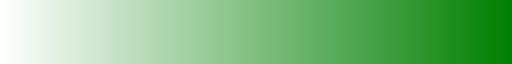

In [61]:
green_cmap

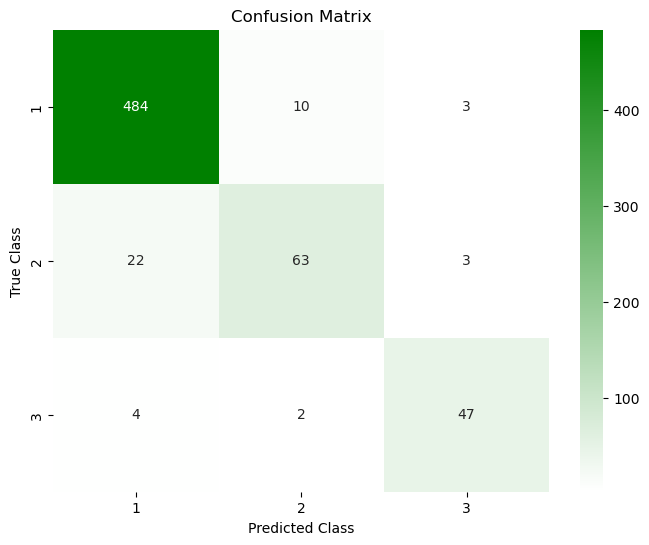

In [76]:
# Plotting the confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(confusion_matrix(Y_test, y_pred), annot=True, fmt="d", cmap=green_cmap, xticklabels=[1, 2, 3], yticklabels=[1, 2, 3])
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.savefig("E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\graphics/_fetal_optimize_confusion_matrix.png")
plt.show()

21. Feature Importance
 - Feature importance is visualized to understand which features contributed the most to the Random Forest model's decisions.

In [63]:
MY_multi_cmap = LinearSegmentedColormap.from_list("mycolor_visulaization", ["white", "green","red","blue","pink"])

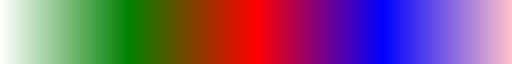

In [64]:
MY_multi_cmap

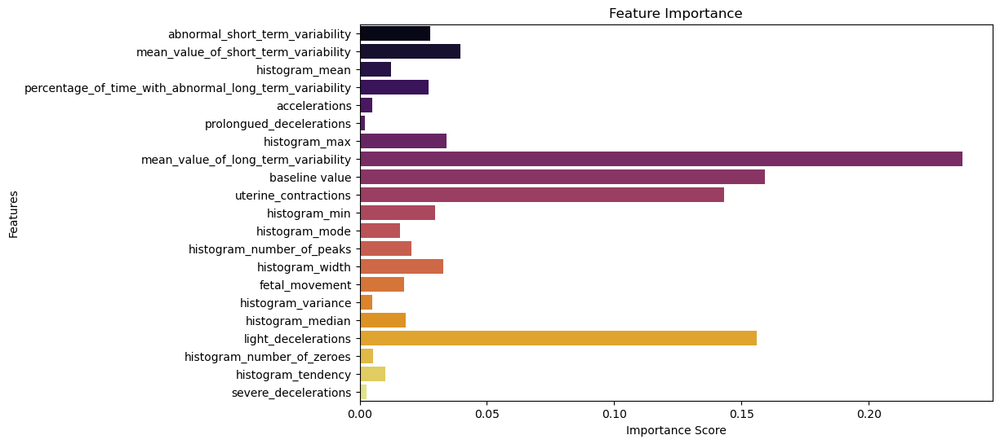

In [77]:
# Visualizing feature importance
feature_importances_x = pd.Series(Gbc_model_op.feature_importances_, index=X_vari.columns)
feature_importances_y = feature_importances_x.sort_values(ascending=False)

plt.figure(figsize=(10, 6))
colors = sns.color_palette("inferno", len(feature_importances_y))
sns.barplot(x=feature_importances_x, y=feature_importances_y.index,palette=colors)
plt.title("Feature Importance")
plt.xlabel("Importance Score")
plt.ylabel("Features")
plt.savefig("E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\graphics/_fetal_dataset_feature_imp.png")
plt.show()

22. Saving the Model
 - The optimized Gradient Boosting model is saved to a file for future use or deployment.

In [78]:
# Save the optimized model using joblib
import joblib
joblib.dump(Gbc_model_op, 'E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\model\optimized_fetal_health_model.pkl')

['E:\\gbc_ai\\careers_planning\\internships\\Medial_treatment_DL\\model\\optimized_fetal_health_model.pkl']

In [79]:
import pickle

In [ ]:
pickle.dump(Gbc_model_op, open('E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\model\optimized_fetal_health_model.sav', 'wb'))

In [81]:
pickle.dump(scale_x, open('E:\gbc_ai\careers_planning\internships\Medial_treatment_DL\model\scaler_fetus', 'wb'))

### for testing the model predction in real time

In [82]:
cwd = os.getcwd()  # Get the current working directory (cwd)
print(cwd)
# files = os.listdir(cwd)  # Get all the files in that directory
# print("Files in %r: %s" % (cwd, files))

e:\gbc_ai\careers_planning\internships\Medial_treatment_DL\notebook


In [87]:
scale_fetus_input = scale_x.transform([[120.0, 0.0, 0.0, 43.0, 62.0, 0.0, 121.0, 0.0, 0.0, 73.0, 64.0, 126.0, 120.0, 73.0, 0.0, 0.0, 0.5, 62.0, 2.0, 137.0, 1.0]])


In [88]:
print(scale_fetus_input.shape)

(1, 21)


In [89]:
predicted_risk = Gbc_model_op.predict(scale_fetus_input)
print(predicted_risk)

[3.]


In [91]:
print(scale_x.n_features_in_)  # Should be 21
print(Gbc_model_op.n_features_in_)  # Should also be 21

21
21


In [92]:
import numpy as np
print(np.isnan(scale_fetus_input).any())  # Should be False
print(np.isinf(scale_fetus_input).any())  # Should be False

False
False


In [93]:
print(Gbc_model_op)


GradientBoostingClassifier(max_depth=10, n_estimators=200, random_state=42)


In [94]:
print(Gbc_model_op.get_params())


{'ccp_alpha': 0.0, 'criterion': 'friedman_mse', 'init': None, 'learning_rate': 0.1, 'loss': 'log_loss', 'max_depth': 10, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 200, 'n_iter_no_change': None, 'random_state': 42, 'subsample': 1.0, 'tol': 0.0001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


In [95]:
test_input = [[100.0, 1.0, 0.0, 50.0, 55.0, 0.0, 130.0, 0.0, 0.0, 80.0, 70.0, 140.0, 110.0, 80.0, 0.0, 0.0, 0.6, 65.0, 3.0, 145.0, 1.2]]
test_input_scaled = scale_x.transform(test_input)
print(Gbc_model_op.predict(test_input_scaled))


[3.]


In [98]:
risk_mapping = {1.0: 'Healthy (Low Risk)', 2.0: 'Medium Risk', 3.0: 'High Risk'}

# Assuming the model prediction is `3.0`:
predicted_risk_class = 3.0
predicted_risk_category = risk_mapping.get(predicted_risk_class, 'Unknown')

print(f"Predicted Risk Category: {predicted_risk_category}")


Predicted Risk Category: High Risk
